<a href="https://colab.research.google.com/github/IsiwaraUmayanga/FYP/blob/main/CNN_Model_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Importing packages

In [1]:
import os
import datetime

import IPython
import IPython.display
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf

mpl.rcParams['figure.figsize'] = (8, 6)
mpl.rcParams['axes.grid'] = False

import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.offline as pyo

#test code

### data set

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
#mounting the data set
path  = "/content/drive/MyDrive/FYP - ML to improve microgrid energy management/UCSD Microgrid Database/Data Files/DemandCharge.csv"
df0=pd.read_csv(path)
df0.head(5)

,DateTime,TotalCampusLoad,OnCampusGeneration,SDG&E Import,AdjustedDemand
0,2/29/2020 23:45,31650.58,30752.804,897.774,-305.422
1,2/29/2020 23:30,31096.75,30750.037,346.711,-859.252
2,2/29/2020 23:15,31236.65,30614.898,621.749,-719.353
3,2/29/2020 23:00,31364.09,30866.657,497.427,-591.916
4,2/29/2020 22:45,31552.81,30785.978,766.840,-403.182


In [4]:
df0

,DateTime,TotalCampusLoad,OnCampusGeneration,SDG&E Import,AdjustedDemand
0,2/29/2020 23:45,31650.58,30752.804,897.774,-305.422
1,2/29/2020 23:30,31096.75,30750.037,346.711,-859.252
2,2/29/2020 23:15,31236.65,30614.898,621.749,-719.353
3,2/29/2020 23:00,31364.09,30866.657,497.427,-591.916
4,2/29/2020 22:45,31552.81,30785.978,766.840,-403.182
...,...,...,...,...,...
75839,1/1/2018 1:00,28648.00,17144.323,12455.270,-2356.407
75840,1/1/2018 0:45,28700.43,17106.156,12450.270,-2399.574
75841,1/1/2018 0:30,28737.36,17342.170,12528.160,-2085.670
75842,1/1/2018 0:15,28779.14,17388.247,12577.250,-1990.503


In [5]:
df0.info()
type(df0)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 75844 entries, 0 to 75843
Data columns (total 5 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   DateTime            75844 non-null  object 
 1   TotalCampusLoad     75844 non-null  float64
 2   OnCampusGeneration  75844 non-null  float64
 3   SDG&E Import        75844 non-null  float64
 4   AdjustedDemand      75844 non-null  float64
dtypes: float64(4), object(1)
memory usage: 2.9+ MB


pandas.core.frame.DataFrame

In [6]:
##reverse rows in data set
df_1= df0.iloc[::-1]

##reset the index and drop existing index
df_1 = df_1.reset_index(drop=True)

#convert the 'Date Time' column to a datetime type
df_1['DateTime'] = pd.to_datetime(df_1['DateTime'], format='%m/%d/%Y %H:%M')

# Set the 'Date Time' column as the index
df_1.set_index('DateTime', inplace=True)

# group the data within one hour take the mean value as one hour data
df = df_1.groupby(pd.Grouper(freq='60Min')).mean()
df_1.head(5)

,TotalCampusLoad,OnCampusGeneration,SDG&E Import,AdjustedDemand
DateTime,,,,
2018-01-01 00:00:00,28947.06,17082.433,12709.43,-2164.137
2018-01-01 00:15:00,28779.14,17388.247,12577.25,-1990.503
2018-01-01 00:30:00,28737.36,17342.170,12528.16,-2085.670
2018-01-01 00:45:00,28700.43,17106.156,12450.27,-2399.574
2018-01-01 01:00:00,28648.00,17144.323,12455.27,-2356.407


In [7]:
##reset the index
#df = df.reset_index()
df.head(5)

,TotalCampusLoad,OnCampusGeneration,SDG&E Import,AdjustedDemand
DateTime,,,,
2018-01-01 00:00:00,28790.9975,17229.75150,12566.2775,-2159.97100
2018-01-01 01:00:00,28703.2125,17192.15475,12489.3650,-2274.48025
2018-01-01 02:00:00,27887.5550,16997.35000,11656.6400,-3302.01000
2018-01-01 03:00:00,28342.3675,17001.70950,12125.6100,-2828.68050
2018-01-01 04:00:00,28537.3925,16932.71725,12328.6525,-2694.63025


In [8]:
df.tail(5)

,TotalCampusLoad,OnCampusGeneration,SDG&E Import,AdjustedDemand
DateTime,,,,
2020-02-29 19:00:00,32217.3050,30579.24375,1638.06650,261.31025
2020-02-29 20:00:00,32457.3800,30574.37725,1883.00125,501.37850
2020-02-29 21:00:00,31820.3775,30576.33175,1244.04325,-135.62500
2020-02-29 22:00:00,31416.3750,30652.71200,763.67325,-539.61475
2020-02-29 23:00:00,31337.0175,30746.09900,590.91525,-618.98575


In [9]:
df.info()
type(df)

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 18960 entries, 2018-01-01 00:00:00 to 2020-02-29 23:00:00
Freq: 60T
Data columns (total 4 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   TotalCampusLoad     18958 non-null  float64
 1   OnCampusGeneration  18958 non-null  float64
 2   SDG&E Import        18958 non-null  float64
 3   AdjustedDemand      18958 non-null  float64
dtypes: float64(4)
memory usage: 740.6 KB


pandas.core.frame.DataFrame

In [10]:
#checking Nan values
nan_counts = df.isna().sum()
nan_counts

TotalCampusLoad       2
OnCampusGeneration    2
SDG&E Import          2
AdjustedDemand        2
dtype: int64

In [11]:
# replace nan with mean value
df = df.fillna(df.mean())

In [12]:
##take datetime coloumn and convert into pandas datetime objects
#date_time = pd.to_datetime(df.pop('DateTime'), format='%m/%d/%Y %H:%M')
#date_time = pd.to_datetime(df['DateTime'], format='%m/%d/%Y %H:%M')
date_time = pd.to_datetime(df.index, format='%m/%d/%Y %H:%M')

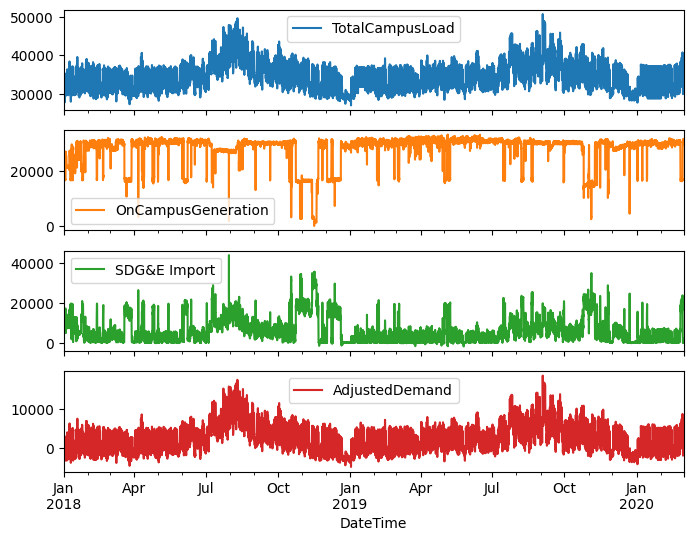

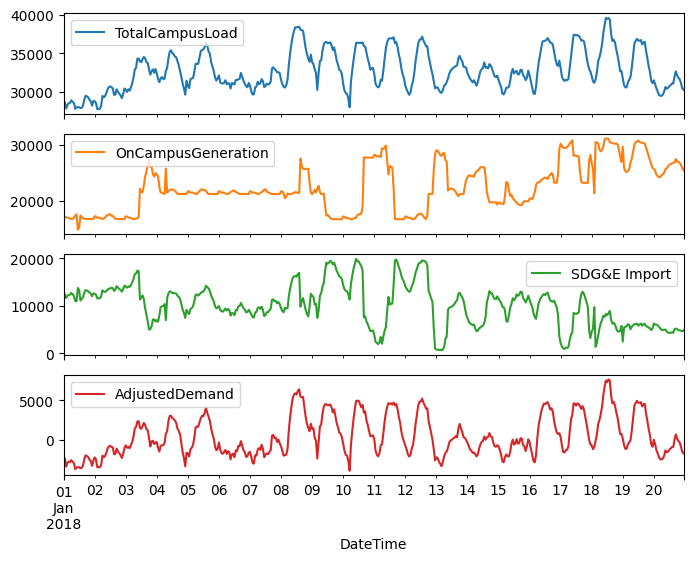

In [13]:
#plot the data set
plot_cols = ['TotalCampusLoad', 'OnCampusGeneration', 'SDG&E Import' , 'AdjustedDemand']
plot_features = df[plot_cols]
plot_features.index = date_time
_ = plot_features.plot(subplots=True)

plot_features = df[plot_cols][:480]
plot_features.index = date_time[:480]
_ = plot_features.plot(subplots=True)

In [14]:
#plot using plotly
plot_cols = ['TotalCampusLoad', 'OnCampusGeneration', 'SDG&E Import', 'AdjustedDemand']

# Create a separate figure for each column and plot it
for col in plot_cols:
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=date_time, y=df[col], mode='lines', name=col))
    fig.update_layout(
        title=f"Time Series Plot for {col}",
        xaxis_title="Date and Time",
        yaxis_title="Value",
        xaxis=dict(type='category'),  # Assuming your date_time is in the correct order
    )
    fig.show()

In [15]:
"""
#plotting the box plot before normalizing the data
# Specify the columns for which you want to create box plots
plot_cols = ['TotalCampusLoad', 'OnCampusGeneration', 'SDG&E Import', 'AdjustedDemand']

# Create box plots for the specified columns
plt.figure(figsize=(12, 6))  # Adjust the figure size as needed
sns.boxplot(data=df[plot_cols])
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.xlabel("Columns")
plt.ylabel("Values")
plt.title("Box Plots for features")

# Show the plot
plt.show()
"""

'\n#plotting the box plot before normalizing the data\n# Specify the columns for which you want to create box plots\nplot_cols = [\'TotalCampusLoad\', \'OnCampusGeneration\', \'SDG&E Import\', \'AdjustedDemand\']\n\n# Create box plots for the specified columns\nplt.figure(figsize=(12, 6))  # Adjust the figure size as needed\nsns.boxplot(data=df[plot_cols])\nplt.xticks(rotation=45)  # Rotate x-axis labels for better readability\nplt.xlabel("Columns")\nplt.ylabel("Values")\nplt.title("Box Plots for features")\n\n# Show the plot\nplt.show()\n'

In [16]:
df.describe

<bound method NDFrame.describe of                      TotalCampusLoad  OnCampusGeneration  SDG&E Import  \
DateTime                                                                 
2018-01-01 00:00:00       28790.9975         17229.75150   12566.27750   
2018-01-01 01:00:00       28703.2125         17192.15475   12489.36500   
2018-01-01 02:00:00       27887.5550         16997.35000   11656.64000   
2018-01-01 03:00:00       28342.3675         17001.70950   12125.61000   
2018-01-01 04:00:00       28537.3925         16932.71725   12328.65250   
...                              ...                 ...           ...   
2020-02-29 19:00:00       32217.3050         30579.24375    1638.06650   
2020-02-29 20:00:00       32457.3800         30574.37725    1883.00125   
2020-02-29 21:00:00       31820.3775         30576.33175    1244.04325   
2020-02-29 22:00:00       31416.3750         30652.71200     763.67325   
2020-02-29 23:00:00       31337.0175         30746.09900     590.91525   

   

In [17]:
#plotting the box plot before normalizing the data
# Specify the columns for which you want to create box plots
plot_cols = ['TotalCampusLoad', 'OnCampusGeneration', 'SDG&E Import', 'AdjustedDemand']

# Create a DataFrame containing the selected columns
plot_df = df[plot_cols]

# Create box plots using Plotly Express
fig = px.box(plot_df, y=plot_df.columns, title="Box Plots for Features")
fig.update_xaxes(title_text="Columns")
fig.update_yaxes(title_text="Values")

# Show the plot
fig.show()

In [18]:
#now look at the statistics of the dataset
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
TotalCampusLoad,18960.0,34416.182914,3454.482176,27050.71250,31703.673125,34029.373750,36587.182500,50714.30750
OnCampusGeneration,18960.0,27929.123319,5624.431722,-71.56000,28610.947875,30153.043875,30883.582000,33442.46000
SDG&E Import,18960.0,6435.467652,6458.984506,-1675.82850,1393.167500,4658.690000,8869.670625,44185.94250
AdjustedDemand,18960.0,2408.590971,3468.762191,-4905.28625,-329.547937,1973.000250,4604.402437,18758.30275


According to box plot it can see that statistics of  columns are different so it is good to normalize this data set for further implementations

In [19]:
#convert date time values to UNIX timestamps
timestamp_s = date_time.map(pd.Timestamp.timestamp)

In [20]:
#use sine and cosine transforms to clear "Time of day" and "Time of year" signals

day = 24*60*60
year = (365.2425)*day

df['Day sin'] = np.sin(timestamp_s * (2 * np.pi / day))
df['Day cos'] = np.cos(timestamp_s * (2 * np.pi / day))
df['Year sin'] = np.sin(timestamp_s * (2 * np.pi / year))
df['Year cos'] = np.cos(timestamp_s * (2 * np.pi / year))

Text(0.5, 1.0, 'Time of day signal')

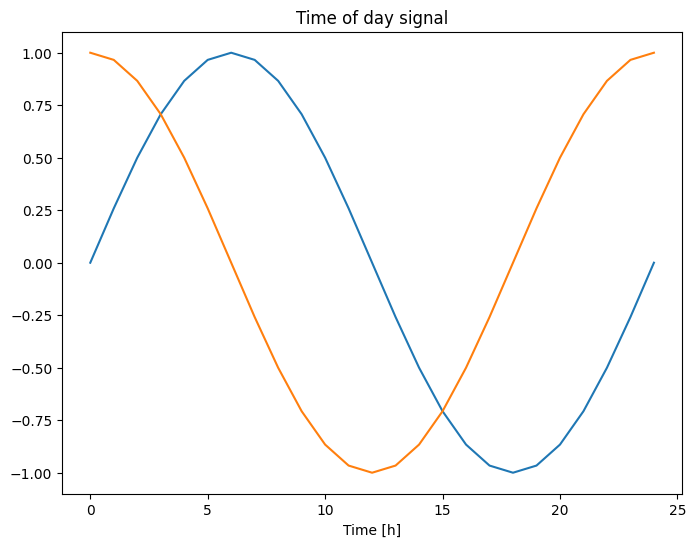

In [21]:
#plotting the date time signal
plt.plot(np.array(df['Day sin'])[:25])
plt.plot(np.array(df['Day cos'])[:25])
plt.xlabel('Time [h]')
plt.title('Time of day signal')

In [22]:
##split data

#creating dictionry column_indices and assign unique index (i) to each column name (name) in the DataFrame
column_indices = {name: i for i, name in enumerate(df.columns)}

#split data into train, validation and testing
n = len(df)
train_df = df[0:int(n*0.7)]
val_df = df[int(n*0.7):int(n*0.9)]
test_df = df[int(n*0.9):]

num_features = df.shape[1]

In [23]:
#normalize the data

#mean and standard deviation should only be computed using the training data so that the models have no access to the values in the validation and test sets.
train_mean = train_df.mean()
train_std = train_df.std()

train_df = (train_df - train_mean) / train_std
val_df = (val_df - train_mean) / train_std
test_df = (test_df - train_mean) / train_std


In [24]:
train_df

,TotalCampusLoad,OnCampusGeneration,SDG&E Import,AdjustedDemand,Day sin,Day cos,Year sin,Year cos
DateTime,,,,,,,,
2018-01-01 00:00:00,-1.610771,-1.754702,0.919182,-1.286833,-3.374963e-12,1.414160,-0.302995,1.422588
2018-01-01 01:00:00,-1.637071,-1.761002,0.907696,-1.320978,3.660116e-01,1.365974,-0.301928,1.422582
2018-01-01 02:00:00,-1.881436,-1.793648,0.783340,-1.627371,7.070801e-01,1.224699,-0.300861,1.422574
2018-01-01 03:00:00,-1.745177,-1.792917,0.853374,-1.486231,9.999623e-01,0.999962,-0.299795,1.422566
2018-01-01 04:00:00,-1.686749,-1.804479,0.883696,-1.446260,1.224699e+00,0.707080,-0.298728,1.422557
...,...,...,...,...,...,...,...,...
2019-07-07 19:00:00,-0.764633,0.571529,-0.882093,-0.744358,-1.365974e+00,0.366012,-0.447418,-1.387230
2019-07-07 20:00:00,-0.744666,0.588272,-0.887059,-0.724483,-1.224699e+00,0.707080,-0.448481,-1.387138
2019-07-07 21:00:00,-0.750415,0.542998,-0.849581,-0.730207,-9.999623e-01,0.999962,-0.449543,-1.387045


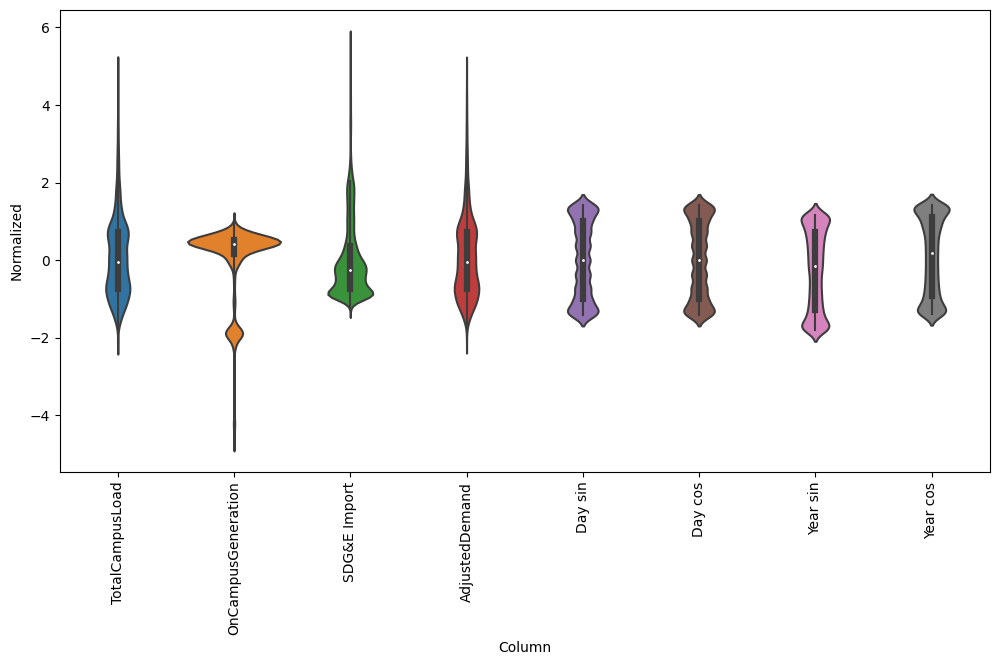

In [25]:
#violin plot on data set after normalization
df_std = (df - train_mean) / train_std
df_std = df_std.melt(var_name='Column', value_name='Normalized')
plt.figure(figsize=(12, 6))
ax = sns.violinplot(x='Column', y='Normalized', data=df_std)
_ = ax.set_xticklabels(df.keys(), rotation=90)

In [26]:
"""
# Create a box plot
plt.figure(figsize=(12, 6))  # Adjust the figure size as needed
ax = sns.boxplot(x='Column', y='Normalized', data=df_std)

# Rotate x-axis labels for better readability
_ = ax.set_xticklabels(df_std['Column'].unique(), rotation=90)

# Add labels and title
plt.xlabel("Column")
plt.ylabel("Normalized Value")
plt.title("Box Plot of Normalized Data")

# Show the plot
plt.show()
"""

'\n# Create a box plot\nplt.figure(figsize=(12, 6))  # Adjust the figure size as needed\nax = sns.boxplot(x=\'Column\', y=\'Normalized\', data=df_std)\n\n# Rotate x-axis labels for better readability\n_ = ax.set_xticklabels(df_std[\'Column\'].unique(), rotation=90)\n\n# Add labels and title\nplt.xlabel("Column")\nplt.ylabel("Normalized Value")\nplt.title("Box Plot of Normalized Data")\n\n# Show the plot\nplt.show()\n'

In [27]:
# Create a box plot using Plotly Express
fig = px.box(df_std, x='Column', y='Normalized', title="Box Plot of Normalized Data")

# Customize the appearance of the plot
fig.update_xaxes(title_text="Column")
fig.update_yaxes(title_text="Normalized Value")

# Rotate x-axis labels for better readability
fig.update_xaxes(tickangle=90)

# Show the plot
fig.show()

###Data windowing

Implement data windowing. it includes \\
width of input and labels \\
time ofset and feature using

In [28]:
#implementing data windowig

class WindowGenerator():
  def __init__(self, input_width, label_width, shift,
               train_df=train_df, val_df=val_df, test_df=test_df,
               label_columns=None):
    # Store the raw data.
    self.train_df = train_df
    self.val_df = val_df
    self.test_df = test_df

    # Work out the label column indices.
    self.label_columns = label_columns
    if label_columns is not None:
      self.label_columns_indices = {name: i for i, name in
                                    enumerate(label_columns)}
    self.column_indices = {name: i for i, name in
                           enumerate(train_df.columns)}

    # Work out the window parameters.
    self.input_width = input_width
    self.label_width = label_width
    self.shift = shift

    self.total_window_size = input_width + shift

    self.input_slice = slice(0, input_width)
    self.input_indices = np.arange(self.total_window_size)[self.input_slice]

    self.label_start = self.total_window_size - self.label_width
    self.labels_slice = slice(self.label_start, None)
    self.label_indices = np.arange(self.total_window_size)[self.labels_slice]

  def __repr__(self):
    return '\n'.join([
        f'Total window size: {self.total_window_size}',
        f'Input indices: {self.input_indices}',
        f'Label indices: {self.label_indices}',
        f'Label column name(s): {self.label_columns}'])

In [29]:
column_indices

{'TotalCampusLoad': 0,
 'OnCampusGeneration': 1,
 'SDG&E Import': 2,
 'AdjustedDemand': 3,
 'Day sin': 4,
 'Day cos': 5,
 'Year sin': 6,
 'Year cos': 7}

In [30]:
#sample window as w2
w2 = WindowGenerator(input_width=6, label_width=1, shift=1,
                     label_columns=['TotalCampusLoad'])
w2

Total window size: 7
Input indices: [0 1 2 3 4 5]
Label indices: [6]
Label column name(s): ['TotalCampusLoad']

###split

In [31]:
#split window convert generated window to a window of inputs and a window of labels.

def split_window(self, features):
  inputs = features[:, self.input_slice, :]
  labels = features[:, self.labels_slice, :]
  if self.label_columns is not None:
    labels = tf.stack(
        [labels[:, :, self.column_indices[name]] for name in self.label_columns],
        axis=-1)

  # Slicing doesn't preserve static shape information, so set the shapes
  # manually. This way the `tf.data.Datasets` are easier to inspect.
  inputs.set_shape([None, self.input_width, None])
  labels.set_shape([None, self.label_width, None])

  return inputs, labels

WindowGenerator.split_window = split_window

In [32]:
"""##example window
# Stack three slices, the length of the total window.
example_window = tf.stack([np.array(train_df[:w2.total_window_size]),
                           np.array(train_df[100:100+w2.total_window_size]),
                           np.array(train_df[200:200+w2.total_window_size])])

example_inputs, example_labels = w2.split_window(example_window)

print('All shapes are: (batch, time, features)')
print(f'Window shape: {example_window.shape}')
print(f'Inputs shape: {example_inputs.shape}')
print(f'Labels shape: {example_labels.shape}')
"""

"##example window\n# Stack three slices, the length of the total window.\nexample_window = tf.stack([np.array(train_df[:w2.total_window_size]),\n                           np.array(train_df[100:100+w2.total_window_size]),\n                           np.array(train_df[200:200+w2.total_window_size])])\n\nexample_inputs, example_labels = w2.split_window(example_window)\n\nprint('All shapes are: (batch, time, features)')\nprint(f'Window shape: {example_window.shape}')\nprint(f'Inputs shape: {example_inputs.shape}')\nprint(f'Labels shape: {example_labels.shape}')\n"

In [33]:
'''##example window
# Stack three slices, the length of the total window.
# Assuming n is the total number of samples
n = len(train_df)

# Select three sample data sets from different locations
sample_indexes = [0, n // 2, n - w2.total_window_size]

example_window = tf.stack([
    np.array(train_df[i:i + w2.total_window_size])
    for i in sample_indexes
])

example_inputs, example_labels = w2.split_window(example_window)

print('All shapes are: (batch, time, features)')
print(f'Window shape: {example_window.shape}')
print(f'Inputs shape: {example_inputs.shape}')
print(f'Labels shape: {example_labels.shape}')'''


"##example window\n# Stack three slices, the length of the total window.\n# Assuming n is the total number of samples\nn = len(train_df)\n\n# Select three sample data sets from different locations\nsample_indexes = [0, n // 2, n - w2.total_window_size]\n\nexample_window = tf.stack([\n    np.array(train_df[i:i + w2.total_window_size])\n    for i in sample_indexes\n])\n\nexample_inputs, example_labels = w2.split_window(example_window)\n\nprint('All shapes are: (batch, time, features)')\nprint(f'Window shape: {example_window.shape}')\nprint(f'Inputs shape: {example_inputs.shape}')\nprint(f'Labels shape: {example_labels.shape}')"

###plot

In [34]:
#w2.example = example_inputs, example_labels

In [35]:
#simple visualization of the split window
def plot(self, model=None, plot_col='TotalCampusLoad', max_subplots=3):
  inputs, labels = self.example
  plt.figure(figsize=(12, 8))
  plot_col_index = self.column_indices[plot_col]
  max_n = min(max_subplots, len(inputs))
  for n in range(max_n):
    plt.subplot(max_n, 1, n+1)
    plt.ylabel(f'{plot_col} [normed]')
    plt.plot(self.input_indices, inputs[n, :, plot_col_index],
             label='Inputs', marker='.', zorder=-10)

    if self.label_columns:
      label_col_index = self.label_columns_indices.get(plot_col, None)
    else:
      label_col_index = plot_col_index

    if label_col_index is None:
      continue

    plt.scatter(self.label_indices, labels[n, :, label_col_index],
                edgecolors='k', label='Labels', c='#2ca02c', s=64)
    if model is not None:
      predictions = model(inputs)
      plt.scatter(self.label_indices, predictions[n, :, label_col_index],
                  marker='X', edgecolors='k', label='Predictions',
                  c='#ff7f0e', s=64)

    if n == 0:
      plt.legend()

  plt.xlabel('Time [h]')

WindowGenerator.plot = plot

In [36]:
'''def plot(self, model=None, plot_col=None, max_subplots=3):
  inputs, labels = self.example
  plt.figure(figsize=(12, 8))
  plot_col_index = self.column_indices.get(plot_col, None)  # Get the column index for the specified plot_col
  if plot_col_index is None:
      print(f'Invalid plot_col: {plot_col}')
      return  # Return early if the specified plot_col is not valid

  max_n = min(max_subplots, len(inputs))
  for n in range(max_n):
    plt.subplot(max_n, 1, n+1)
    plt.ylabel(f'{plot_col} [normed]')
    plt.plot(self.input_indices, inputs[n, :, plot_col_index],
             label='Inputs', marker='.', zorder=-10)

    if self.label_columns:
      label_col_index = self.label_columns_indices.get(plot_col, None)
    else:
      label_col_index = plot_col_index

    if label_col_index is None:
      continue

    plt.scatter(self.label_indices, labels[n, :, label_col_index],
                edgecolors='k', label='Labels', c='#2ca02c', s=64)
    if model is not None:
      predictions = model(inputs)
      plt.scatter(self.label_indices, predictions[n, :, label_col_index],
                  marker='X', edgecolors='k', label='Predictions',
                  c='#ff7f0e', s=64)

    if n == 0:
      plt.legend()

  plt.xlabel('Time [h]')

WindowGenerator.plot = plot'''


"def plot(self, model=None, plot_col=None, max_subplots=3):\n  inputs, labels = self.example\n  plt.figure(figsize=(12, 8))\n  plot_col_index = self.column_indices.get(plot_col, None)  # Get the column index for the specified plot_col\n  if plot_col_index is None:\n      print(f'Invalid plot_col: {plot_col}')\n      return  # Return early if the specified plot_col is not valid\n\n  max_n = min(max_subplots, len(inputs))\n  for n in range(max_n):\n    plt.subplot(max_n, 1, n+1)\n    plt.ylabel(f'{plot_col} [normed]')\n    plt.plot(self.input_indices, inputs[n, :, plot_col_index],\n             label='Inputs', marker='.', zorder=-10)\n\n    if self.label_columns:\n      label_col_index = self.label_columns_indices.get(plot_col, None)\n    else:\n      label_col_index = plot_col_index\n\n    if label_col_index is None:\n      continue\n\n    plt.scatter(self.label_indices, labels[n, :, label_col_index],\n                edgecolors='k', label='Labels', c='#2ca02c', s=64)\n    if model is n

In [37]:
#w2.plot(plot_col='OnCampusGeneration')

###Create tf.data.Datasets

In [38]:
def make_dataset(self, data):
  data = np.array(data, dtype=np.float32)
  ds = tf.keras.utils.timeseries_dataset_from_array(
      data=data,
      targets=None,
      sequence_length=self.total_window_size,
      sequence_stride=1,
      shuffle=True,
      batch_size=32,)

  ds = ds.map(self.split_window)

  return ds

WindowGenerator.make_dataset = make_dataset

In [39]:
@property
def train(self):
  return self.make_dataset(self.train_df)

@property
def val(self):
  return self.make_dataset(self.val_df)

@property
def test(self):
  return self.make_dataset(self.test_df)

@property
def example(self):
  """Get and cache an example batch of `inputs, labels` for plotting."""
  result = getattr(self, '_example', None)
  if result is None:
    # No example batch was found, so get one from the `.train` dataset
    result = next(iter(self.train))
    #result = next(iter(self.test))
    # And cache it for next time
    self._example = result
  return result

WindowGenerator.train = train
WindowGenerator.val = val
WindowGenerator.test = test
WindowGenerator.example = example

In [40]:
# Each element is an (inputs, label) pair.
# this gives structure, data types, and shapes of the dataset elements.
#w2.train.element_spec

In [41]:
#for example_inputs, example_labels in w2.train.take(1):
 # print(f'Inputs shape (batch, time, features): {example_inputs.shape}')
  #print(f'Labels shape (batch, time, features): {example_labels.shape}')

###single step model

In [42]:
#create a single step window to forecast single step
single_step_window = WindowGenerator(
    input_width=1, label_width=1, shift=1,
    label_columns=['TotalCampusLoad'])
single_step_window

Total window size: 2
Input indices: [0]
Label indices: [1]
Label column name(s): ['TotalCampusLoad']

####Baseline

In [43]:
#create simple baseline model which gives current value as prediction
class Baseline(tf.keras.Model):
  def __init__(self, label_index=None):
    super().__init__()
    self.label_index = label_index

  def call(self, inputs):
    if self.label_index is None:
      return inputs
    result = inputs[:, :, self.label_index]
    return result[:, :, tf.newaxis]

In [44]:
#run the baseline model
baseline = Baseline(label_index=column_indices['TotalCampusLoad'])

baseline.compile(loss=tf.keras.losses.MeanSquaredError(),
                 metrics=[tf.keras.metrics.MeanAbsoluteError()])

val_performance = {}  ##dictionary to store validation performance data
performance = {}      ##dectionary to store rest performance data
val_performance['Baseline'] = baseline.evaluate(single_step_window.val)
performance['Baseline'] = baseline.evaluate(single_step_window.test, verbose=0)

119/119 [==============================] - 1s 4ms/step - loss: 0.0598 - mean_absolute_error: 0.1828


In [45]:
#create a window that generates windows 24 hours of consecutive inputs and labels at a time.
wide_window = WindowGenerator(
    input_width=24, label_width=24, shift=1,
    label_columns=['TotalCampusLoad'])

wide_window

Total window size: 25
Input indices: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
Label indices: [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24]
Label column name(s): ['TotalCampusLoad']

In [46]:
#print('Input shape:', wide_window.example[0].shape)
#print('Output shape:', baseline(wide_window.example[0]).shape)

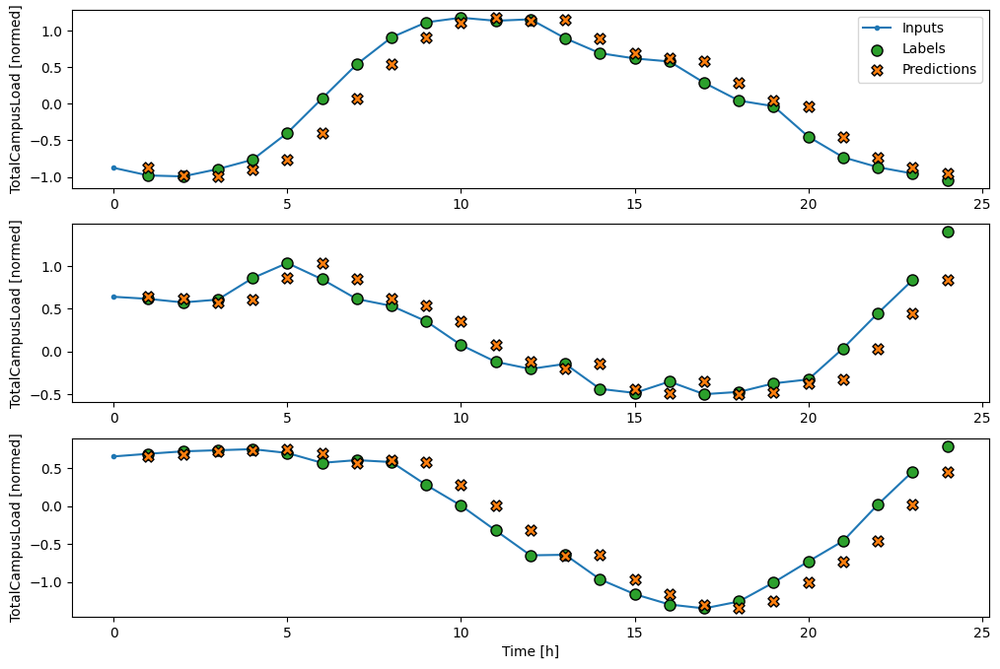

In [47]:
wide_window.plot(baseline)

####linear model

In [48]:
#creating a linear model
linear = tf.keras.Sequential([
    tf.keras.layers.Dense(units=1)
])

In [49]:
print('Input shape:', single_step_window.example[0].shape)
print('Output shape:', linear(single_step_window.example[0]).shape)

Input shape: (32, 1, 8)
Output shape: (32, 1, 1)


In [50]:
#create a package which include training procedure
MAX_EPOCHS = 20

def compile_and_fit(model, window, patience=2):
  early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                    patience=patience,
                                                    mode='min')

  model.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=[tf.keras.metrics.MeanAbsoluteError()])

  history = model.fit(window.train, epochs=MAX_EPOCHS,
                      validation_data=window.val,
                      callbacks=[early_stopping])
  return history

In [51]:
#train the linear model and evaluate
history = compile_and_fit(linear, single_step_window)

val_performance['Linear'] = linear.evaluate(single_step_window.val)
performance['Linear'] = linear.evaluate(single_step_window.test, verbose=0)

Epoch 1/20
415/415 [==============================] - 3s 6ms/step - loss: 0.3568 - mean_absolute_error: 0.4684 - val_loss: 0.1395 - val_mean_absolute_error: 0.2900
Epoch 2/20
415/415 [==============================] - 4s 10ms/step - loss: 0.0612 - mean_absolute_error: 0.1904 - val_loss: 0.0450 - val_mean_absolute_error: 0.1536
Epoch 3/20
415/415 [==============================] - 2s 6ms/step - loss: 0.0322 - mean_absolute_error: 0.1343 - val_loss: 0.0396 - val_mean_absolute_error: 0.1418
Epoch 4/20
415/415 [==============================] - 2s 4ms/step - loss: 0.0298 - mean_absolute_error: 0.1270 - val_loss: 0.0400 - val_mean_absolute_error: 0.1426
Epoch 5/20
119/119 [==============================] - 1s 4ms/step - loss: 0.0401 - mean_absolute_error: 0.1430


In [52]:
print('Input shape:', wide_window.example[0].shape)
print('Output shape:', linear(wide_window.example[0]).shape)

Input shape: (32, 24, 8)
Output shape: (32, 24, 1)


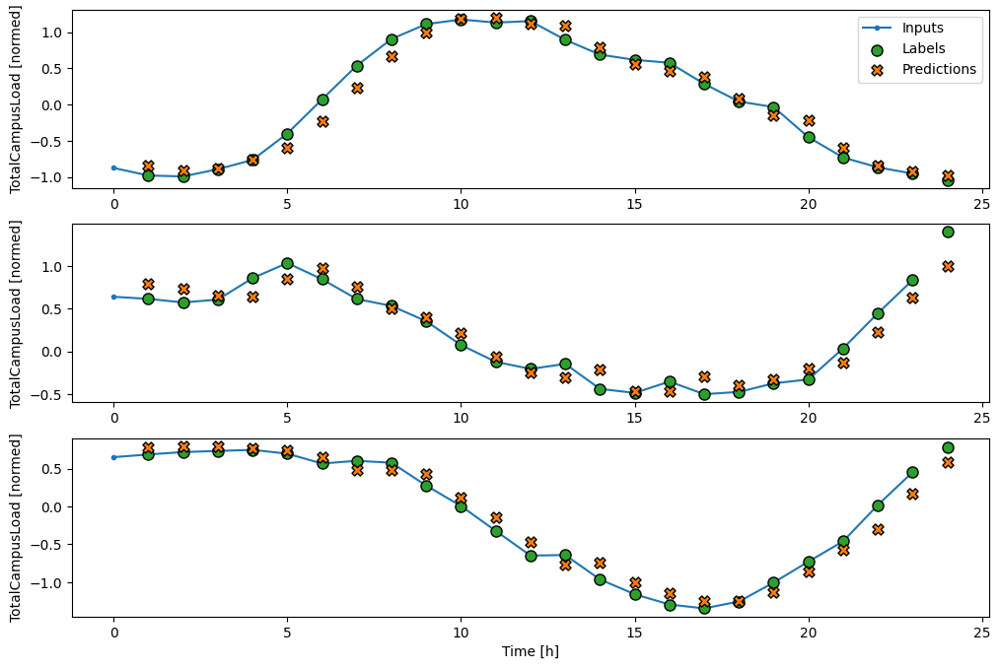

In [53]:
#plot the linear model to wide window
wide_window.plot(linear)

####CNN model

In [54]:
##create conv_window torun the model. in this model itpredict 4th value using previous 3 values
CONV_WIDTH = 3
conv_window = WindowGenerator(
    input_width=CONV_WIDTH,
    label_width=1,
    shift=1,
    label_columns=['TotalCampusLoad'])

conv_window

Total window size: 4
Input indices: [0 1 2]
Label indices: [3]
Label column name(s): ['TotalCampusLoad']

In [55]:
#conv_window.plot()

In [56]:
##convolutional model
conv_model = tf.keras.Sequential([
    tf.keras.layers.Conv1D(filters=32,
                           kernel_size=(CONV_WIDTH,),
                           activation='relu'),
    tf.keras.layers.Dense(units=32, activation='relu'),
    tf.keras.layers.Dense(units=1),
])

In [57]:
print("Conv model on `conv_window`")
print('Input shape:', conv_window.example[0].shape)
print('Output shape:', conv_model(conv_window.example[0]).shape)

Conv model on `conv_window`
Input shape: (32, 3, 8)
Output shape: (32, 1, 1)


In [58]:
#train connolutin method and evaluate
history = compile_and_fit(conv_model, conv_window)

IPython.display.clear_output()
val_performance['Conv'] = conv_model.evaluate(conv_window.val)
performance['Conv'] = conv_model.evaluate(conv_window.test, verbose=0)

119/119 [==============================] - 0s 3ms/step - loss: 0.0350 - mean_absolute_error: 0.1341


In [59]:
#nan_counts = df.isna().sum()
#nan_counts

In [60]:
print("Wide window")
print('Input shape:', wide_window.example[0].shape)
print('Labels shape:', wide_window.example[1].shape)
print('Output shape:', conv_model(wide_window.example[0]).shape)

Wide window
Input shape: (32, 24, 8)
Labels shape: (32, 24, 1)
Output shape: (32, 22, 1)


In [61]:
#create wide window for cnn
LABEL_WIDTH = 24
INPUT_WIDTH = LABEL_WIDTH + (CONV_WIDTH - 1)
wide_conv_window = WindowGenerator(
    input_width=INPUT_WIDTH,
    label_width=LABEL_WIDTH,
    shift=1,
    label_columns=['TotalCampusLoad'])

wide_conv_window

Total window size: 27
Input indices: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25]
Label indices: [ 3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26]
Label column name(s): ['TotalCampusLoad']

In [62]:
print("Wide conv window")
print('Input shape:', wide_conv_window.example[0].shape)
print('Labels shape:', wide_conv_window.example[1].shape)
print('Output shape:', conv_model(wide_conv_window.example[0]).shape)

Wide conv window
Input shape: (32, 26, 8)
Labels shape: (32, 24, 1)
Output shape: (32, 24, 1)


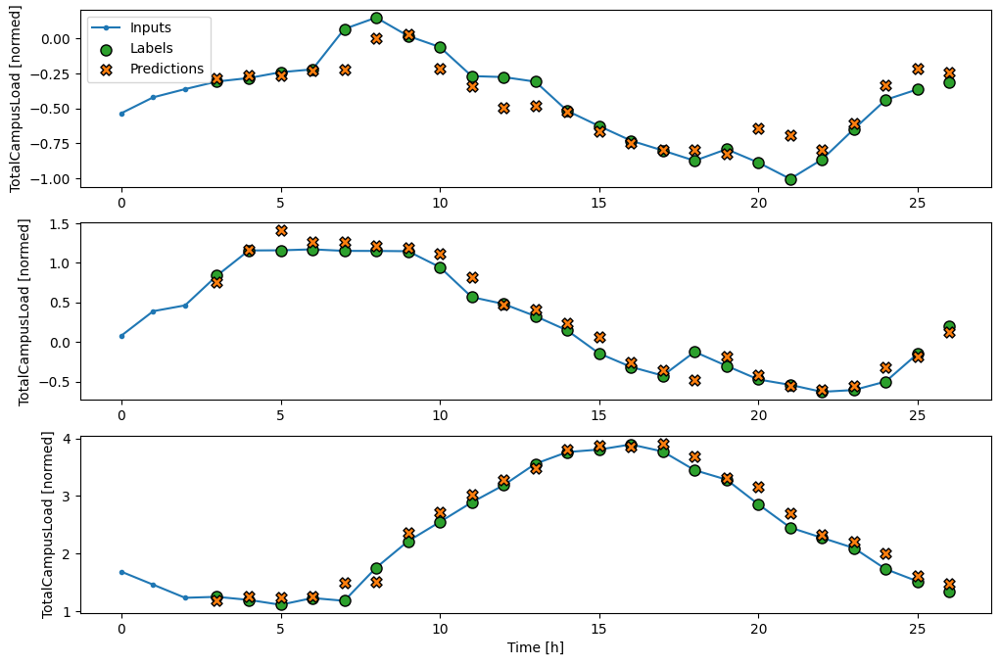

In [63]:
#plot the cnn model
wide_conv_window.plot(conv_model)

###multi step models

In multy step models we can forecst day ahead data. so accordingly we have to create window and models

In [64]:
'''#create a package which include training procedure
import tensorflow as tf

MAX_EPOCHS = 20

def compile_and_fit(model, window, patience=2):
  early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',
                                                    patience=patience,
                                                    mode='min')

  model.compile(loss=tf.keras.losses.MeanSquaredError(),
                optimizer=tf.keras.optimizers.Adam(),
                metrics=[tf.keras.metrics.MeanAbsoluteError()])

  history = model.fit(window.train, epochs=MAX_EPOCHS,
                      validation_data=window.val,
                      callbacks=[early_stopping])
  return history'''

"#create a package which include training procedure\nimport tensorflow as tf\n\nMAX_EPOCHS = 20\n\ndef compile_and_fit(model, window, patience=2):\n  early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss',\n                                                    patience=patience,\n                                                    mode='min')\n\n  model.compile(loss=tf.keras.losses.MeanSquaredError(),\n                optimizer=tf.keras.optimizers.Adam(),\n                metrics=[tf.keras.metrics.MeanAbsoluteError()])\n\n  history = model.fit(window.train, epochs=MAX_EPOCHS,\n                      validation_data=window.val,\n                      callbacks=[early_stopping])\n  return history"

In [65]:
import tensorflow as tf

MAX_EPOCHS = 20

def compile_and_fit(model, window, patience=2):
    # Callback for early stopping with patience
    early_stopping = tf.keras.callbacks.EarlyStopping(
        monitor='val_loss',
        patience=patience,
        mode='min',
        restore_best_weights=True  # Restore the best model weights upon early stopping
    )

    # Learning rate schedule
    lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=1e-3,
        decay_steps=1000,
        decay_rate=0.9
    )

    # Adam optimizer with learning rate schedule
    optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)

    # Compile the model with mean squared error loss and mean absolute error metric
    model.compile(
        loss=tf.keras.losses.MeanSquaredError(),
        optimizer=optimizer,
        metrics=[tf.keras.metrics.MeanAbsoluteError()]
    )

    # Train the model
    history = model.fit(
        window.train,
        epochs=MAX_EPOCHS,
        validation_data=window.val,
        callbacks=[early_stopping]
    )

    return history


In [66]:
#create a window for multy step models
OUT_STEPS = 24
multi_window = WindowGenerator(input_width=24,
                               label_width=OUT_STEPS,
                               shift=OUT_STEPS)

#multi_window.plot()
multi_window

Total window size: 48
Input indices: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23]
Label indices: [24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47]
Label column name(s): None

####Repeat baseline model

In [67]:
multi_train_performance = {}
multi_val_performance = {}
multi_test_performance = {}

118/118 [==============================] - 0s 4ms/step - loss: 0.2740 - mean_absolute_error: 0.2262


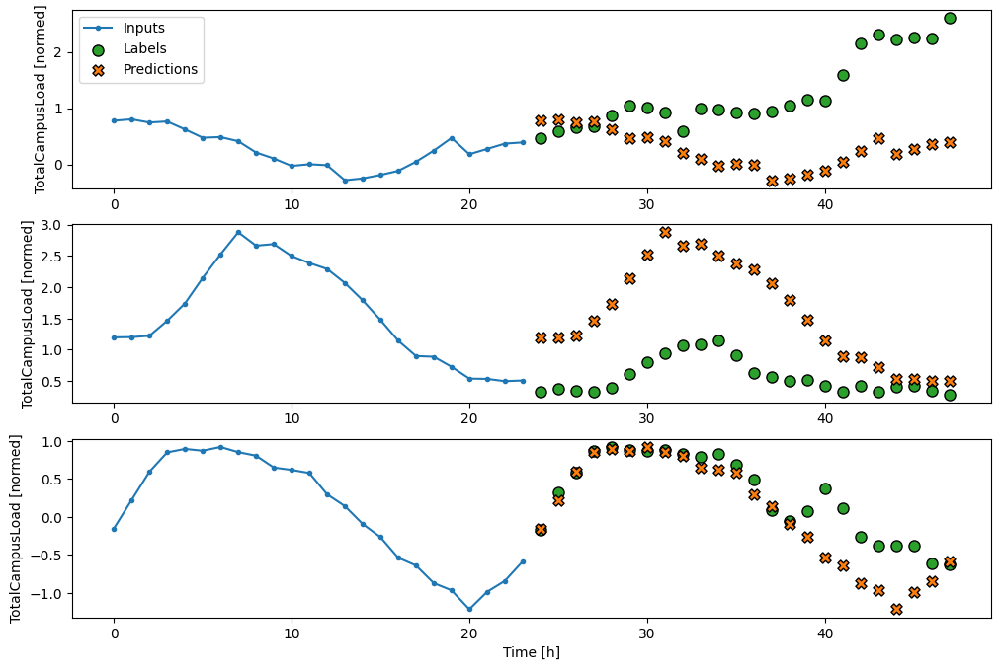

In [68]:
#create baseline model where it repeate the previous day values
class RepeatBaseline(tf.keras.Model):
  def call(self, inputs):
    return inputs

repeat_baseline = RepeatBaseline()
repeat_baseline.compile(loss=tf.keras.losses.MeanSquaredError(),
                        metrics=[tf.keras.metrics.MeanAbsoluteError()])

#multi_val_performance = {}
#multi_performance = {}

#multi_val_performance['RepeatBaseline'] = repeat_baseline.evaluate(multi_window.val)
#multi_performance['RepeatBaseline'] = repeat_baseline.evaluate(multi_window.test, verbose=0)
multi_train_performance['RepeatBaseline'] = repeat_baseline.evaluate(multi_window.train)
multi_val_performance['RepeatBaseline'] = repeat_baseline.evaluate(multi_window.val)
multi_test_performance['RepeatBaseline'] = repeat_baseline.evaluate(multi_window.test, verbose=0) #verbose=0, the evaluation is performed quietly, and no progress or result information is printed
multi_window.plot(repeat_baseline)  ##plot the baseline model

####CNN model

In [69]:
##create CNN model which makes predictions based on a fixed-width history
'''
CONV_WIDTH = 8
CNN_model = tf.keras.Sequential([
    # Shape [batch, time, features] => [batch, CONV_WIDTH, features]
    tf.keras.layers.Lambda(lambda x: x[:, -CONV_WIDTH:, :]),
    # Shape => [batch, 1, conv_units]
    tf.keras.layers.Conv1D(256, activation='relu', kernel_size=(CONV_WIDTH)),
    # Shape => [batch, 1,  out_steps*features]
    tf.keras.layers.Dense(OUT_STEPS*num_features,
                          kernel_initializer=tf.initializers.zeros()),
    # Shape => [batch, out_steps, features]
    tf.keras.layers.Reshape([OUT_STEPS, num_features])
])

history = compile_and_fit(CNN_model, multi_window)

IPython.display.clear_output()

#multi_val_performance['CNN'] = multi_conv_model.evaluate(multi_window.val)
#multi_performance['CNN'] = multi_conv_model.evaluate(multi_window.test, verbose=0)
#multi_window.plot(multi_conv_model)'''

"\nCONV_WIDTH = 8\nCNN_model = tf.keras.Sequential([\n    # Shape [batch, time, features] => [batch, CONV_WIDTH, features]\n    tf.keras.layers.Lambda(lambda x: x[:, -CONV_WIDTH:, :]),\n    # Shape => [batch, 1, conv_units]\n    tf.keras.layers.Conv1D(256, activation='relu', kernel_size=(CONV_WIDTH)),\n    # Shape => [batch, 1,  out_steps*features]\n    tf.keras.layers.Dense(OUT_STEPS*num_features,\n                          kernel_initializer=tf.initializers.zeros()),\n    # Shape => [batch, out_steps, features]\n    tf.keras.layers.Reshape([OUT_STEPS, num_features])\n])\n\nhistory = compile_and_fit(CNN_model, multi_window)\n\nIPython.display.clear_output()\n\n#multi_val_performance['CNN'] = multi_conv_model.evaluate(multi_window.val)\n#multi_performance['CNN'] = multi_conv_model.evaluate(multi_window.test, verbose=0)\n#multi_window.plot(multi_conv_model)"

In [70]:
CONV_WIDTH = 8

CNN_model = tf.keras.Sequential([
    # Lambda layer to select the last CONV_WIDTH time steps
    tf.keras.layers.Lambda(lambda x: x[:, -CONV_WIDTH:, :]),
    # Convolutional layer with ReLU activation and He initialization
    tf.keras.layers.Conv1D(256, activation='relu', kernel_size=CONV_WIDTH, kernel_initializer='he_normal'),
    # Batch Normalization layer
    tf.keras.layers.BatchNormalization(),
    # Dropout layer for regularization
    tf.keras.layers.Dropout(0.2),
    # Dense layer with linear activation and He initialization
    tf.keras.layers.Dense(OUT_STEPS*num_features, activation='linear', kernel_initializer='he_normal'),
    # Reshape layer to match the output shape
    tf.keras.layers.Reshape([OUT_STEPS, num_features])
])

history = compile_and_fit(CNN_model, multi_window)

IPython.display.clear_output()


118/118 [==============================] - 1s 7ms/step - loss: 0.1527 - mean_absolute_error: 0.1971


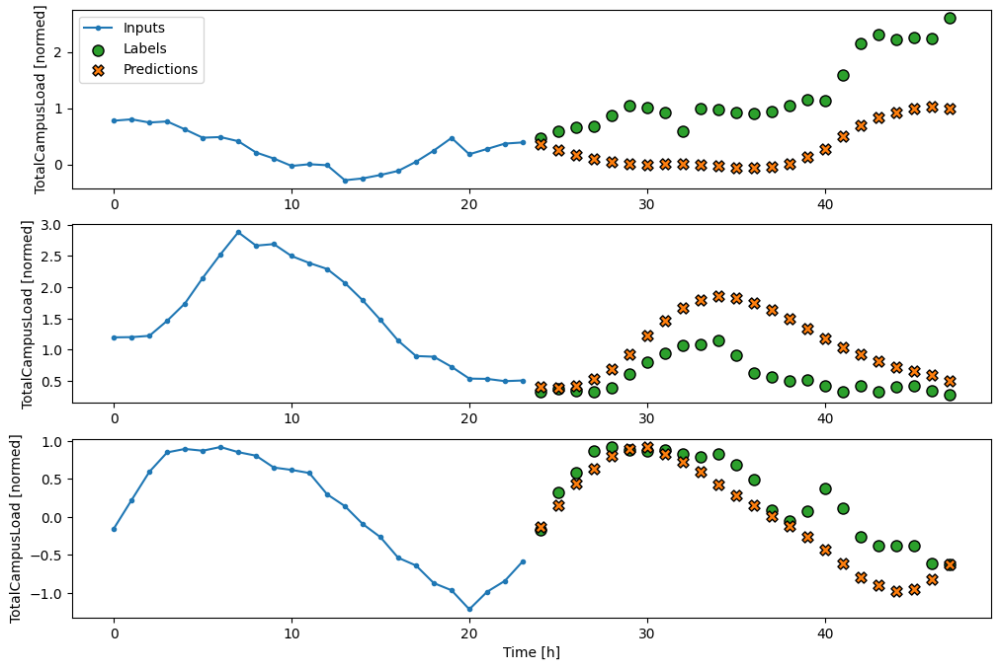

In [71]:
# Evaluate
multi_train_performance['CNN'] = CNN_model.evaluate(multi_window.train) #training data performance
multi_val_performance['CNN'] = CNN_model.evaluate(multi_window.val) #validation data performance
multi_test_performance['CNN'] = CNN_model.evaluate(multi_window.test, verbose=0) #test data performanve

# Plot the performance
multi_window.plot(CNN_model)

In [72]:
##CONV_WIDTH = 3
'''
CONV_WIDTH = 3
multi_CNN_model1 = tf.keras.Sequential([
    # Shape [batch, time, features] => [batch, CONV_WIDTH, features]
    tf.keras.layers.Lambda(lambda x: x[:, -CONV_WIDTH:, :]),
    # Shape => [batch, 1, conv_units]
    tf.keras.layers.Conv1D(256, activation='relu', kernel_size=(CONV_WIDTH)),
    # Shape => [batch, 1,  out_steps*features]
    tf.keras.layers.Dense(OUT_STEPS*num_features,
                          kernel_initializer=tf.initializers.zeros()),
    # Shape => [batch, out_steps, features]
    tf.keras.layers.Reshape([OUT_STEPS, num_features])
])

history = compile_and_fit(multi_CNN_model1 , multi_window)

IPython.display.clear_output()

multi_val_performance['CNN2'] = multi_CNN_model1 .evaluate(multi_window.val)
multi_performance['CNN2'] = multi_CNN_model1 .evaluate(multi_window.test, verbose=0)
multi_window.plot(multi_CNN_model1 )
'''

"\nCONV_WIDTH = 3\nmulti_CNN_model1 = tf.keras.Sequential([\n    # Shape [batch, time, features] => [batch, CONV_WIDTH, features]\n    tf.keras.layers.Lambda(lambda x: x[:, -CONV_WIDTH:, :]),\n    # Shape => [batch, 1, conv_units]\n    tf.keras.layers.Conv1D(256, activation='relu', kernel_size=(CONV_WIDTH)),\n    # Shape => [batch, 1,  out_steps*features]\n    tf.keras.layers.Dense(OUT_STEPS*num_features,\n                          kernel_initializer=tf.initializers.zeros()),\n    # Shape => [batch, out_steps, features]\n    tf.keras.layers.Reshape([OUT_STEPS, num_features])\n])\n\nhistory = compile_and_fit(multi_CNN_model1 , multi_window)\n\nIPython.display.clear_output()\n\nmulti_val_performance['CNN2'] = multi_CNN_model1 .evaluate(multi_window.val)\nmulti_performance['CNN2'] = multi_CNN_model1 .evaluate(multi_window.test, verbose=0)\nmulti_window.plot(multi_CNN_model1 )\n"

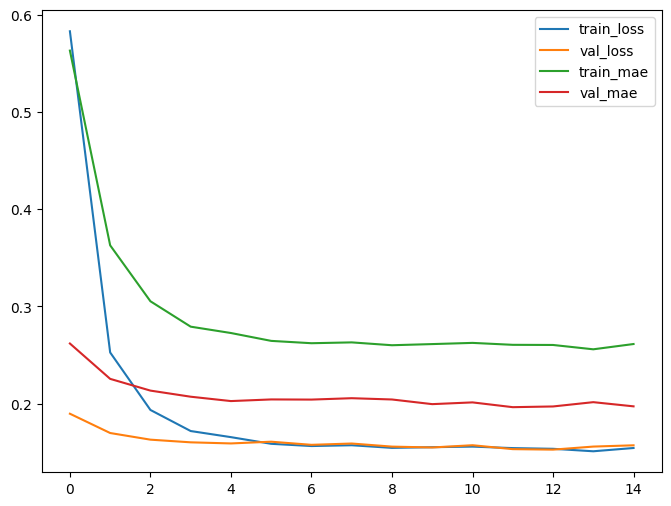

In [73]:
import matplotlib.pyplot as plt

def plot_training_history(history):
    # Plot training history (loss and metrics)
    plt.plot(history.history['loss'], label='train_loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.plot(history.history['mean_absolute_error'], label='train_mae')
    plt.plot(history.history['val_mean_absolute_error'], label='val_mae')
    plt.legend()
    plt.show()

plot_training_history(history)

In [74]:
#multi_val_performance

In [75]:
#multi_performance

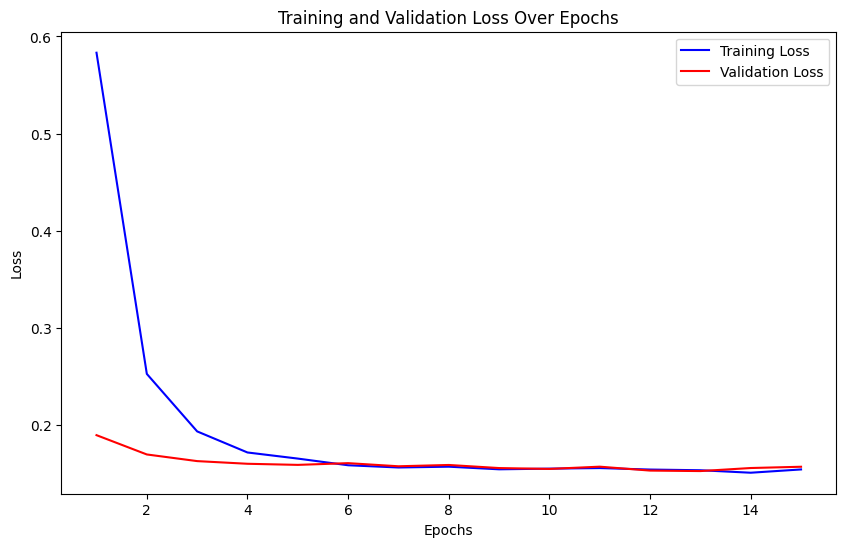

In [76]:
# Get training and validation losses
training_loss = history.history['loss']
validation_loss = history.history['val_loss']

# Plot the losses
epochs = range(1, len(training_loss) + 1) #number of epochs is len(training_loss)

#loss in v[0]
train_loss = multi_train_performance['CNN']
val_loss = multi_val_performance['CNN']
test_loss = multi_test_performance['CNN']

plt.figure(figsize=(10, 6))
plt.plot(epochs, training_loss, 'b', label='Training Loss')
plt.plot(epochs, validation_loss, 'r', label='Validation Loss')
plt.title('Training and Validation Loss Over Epochs')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [77]:
# Model name
model_name = 'CNN'

# Print the loss values
print(f"Training Loss for {model_name}: {multi_train_performance[model_name][0]}")
print(f"Validation Loss for {model_name}: {multi_val_performance[model_name][0]}")
print(f"Test Loss for {model_name}: {multi_test_performance[model_name][0]}")

Training Loss for CNN: 0.11268191039562225
Validation Loss for CNN: 0.15270335972309113
Test Loss for CNN: 0.10406188666820526


In [78]:
multi_train_performance

{'RepeatBaseline': [0.22097954154014587, 0.19152726233005524],
 'CNN': [0.11268191039562225, 0.16896429657936096]}

In [79]:
'''
# Evaluate
multi_train_performance['CNN'] = CNN_model.evaluate(multi_window.train) #training data performance
multi_val_performance['CNN'] = CNN_model.evaluate(multi_window.val) #validation data performance
multi_test_performance['CNN'] = CNN_model.evaluate(multi_window.test, verbose=0) #test data performanve

# Plot the performance
multi_window.plot(CNN_model)'''

"\n# Evaluate\nmulti_train_performance['CNN'] = CNN_model.evaluate(multi_window.train) #training data performance\nmulti_val_performance['CNN'] = CNN_model.evaluate(multi_window.val) #validation data performance\nmulti_test_performance['CNN'] = CNN_model.evaluate(multi_window.test, verbose=0) #test data performanve\n\n# Plot the performance\nmulti_window.plot(CNN_model)"

###no need

In [80]:
#predicted_data = CNN_model.predict(inputs)

In [81]:
#predicted_data

In [82]:
'''# Get the actual values for training, validation, and testing sets
actual_train_values = multi_window.train.labels
actual_val_values = multi_window.val.labels
actual_test_values = multi_window.test.labels
# Extract the training, validation, and testing data from the original DataFrame
actual_train_data = multi_window.train_df
actual_val_data = multi_window.val_df
actual_test_data = multi_window.test_df

# Assuming that your label column is named 'TotalCampusLoad', you can extract it as follows:
actual_train_values = actual_train_data['TotalCampusLoad'].values
actual_val_values = actual_val_data['TotalCampusLoad'].values
actual_test_values = actual_test_data['TotalCampusLoad'].values

# Get the predicted values for training, validation, and testing sets
predicted_train_values = CNN_model.predict(multi_window.train)
predicted_val_values = CNN_model.predict(multi_window.val)
predicted_test_values = CNN_model.predict(multi_window.test)'''

"# Get the actual values for training, validation, and testing sets\nactual_train_values = multi_window.train.labels\nactual_val_values = multi_window.val.labels\nactual_test_values = multi_window.test.labels\n# Extract the training, validation, and testing data from the original DataFrame\nactual_train_data = multi_window.train_df\nactual_val_data = multi_window.val_df\nactual_test_data = multi_window.test_df\n\n# Assuming that your label column is named 'TotalCampusLoad', you can extract it as follows:\nactual_train_values = actual_train_data['TotalCampusLoad'].values\nactual_val_values = actual_val_data['TotalCampusLoad'].values\nactual_test_values = actual_test_data['TotalCampusLoad'].values\n\n# Get the predicted values for training, validation, and testing sets\npredicted_train_values = CNN_model.predict(multi_window.train)\npredicted_val_values = CNN_model.predict(multi_window.val)\npredicted_test_values = CNN_model.predict(multi_window.test)"

In [83]:
#len(actual_train_values)

In [84]:
#type(actual_train_values)

In [85]:
#len(predicted_train_values)

In [86]:
'''# Get the predicted values for training, validation, and testing sets
predicted_train_values = CNN_model.predict(multi_window.train)
predicted_val_values = CNN_model.predict(multi_window.val)
predicted_test_values = CNN_model.predict(multi_window.test)

# Assuming 'TotalCampusLoad' is at a specific column index, for example, column 0
column_index = 0

predicted_train_values_total_load = predicted_train_values[:, :, column_index]
predicted_val_values_total_load = predicted_val_values[:, :, column_index]
predicted_test_values_total_load = predicted_test_values[:, :, column_index]
'''

"# Get the predicted values for training, validation, and testing sets\npredicted_train_values = CNN_model.predict(multi_window.train)\npredicted_val_values = CNN_model.predict(multi_window.val)\npredicted_test_values = CNN_model.predict(multi_window.test)\n\n# Assuming 'TotalCampusLoad' is at a specific column index, for example, column 0\ncolumn_index = 0\n\npredicted_train_values_total_load = predicted_train_values[:, :, column_index]\npredicted_val_values_total_load = predicted_val_values[:, :, column_index]\npredicted_test_values_total_load = predicted_test_values[:, :, column_index]\n"

In [87]:
#len(predicted_train_values_total_load)

In [88]:
'''import matplotlib.pyplot as plt

# Create a function to plot actual values
def plot_actual_values(actual_values, title):
    plt.figure(figsize=(12, 6))
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Values')

    # Assuming that the time index is available in your dataset
    time_index = range(len(actual_values))

    plt.plot(time_index, actual_values, label='Actual', marker='.', markersize=5)

    plt.legend()
    plt.grid(True)
    plt.show()

# Plot for the training set
plot_actual_values(actual_train_values, 'Actual Training Set')

# Plot for the validation set
plot_actual_values(actual_val_values, 'Actual Validation Set')

# Plot for the testing set
plot_actual_values(actual_test_values, 'Actual Testing Set')'''


"import matplotlib.pyplot as plt\n\n# Create a function to plot actual values\ndef plot_actual_values(actual_values, title):\n    plt.figure(figsize=(12, 6))\n    plt.title(title)\n    plt.xlabel('Time')\n    plt.ylabel('Values')\n\n    # Assuming that the time index is available in your dataset\n    time_index = range(len(actual_values))\n\n    plt.plot(time_index, actual_values, label='Actual', marker='.', markersize=5)\n\n    plt.legend()\n    plt.grid(True)\n    plt.show()\n\n# Plot for the training set\nplot_actual_values(actual_train_values, 'Actual Training Set')\n\n# Plot for the validation set\nplot_actual_values(actual_val_values, 'Actual Validation Set')\n\n# Plot for the testing set\nplot_actual_values(actual_test_values, 'Actual Testing Set')"

In [89]:
'''import matplotlib.pyplot as plt

# Create a function to plot predicted values
def plot_predicted_values(predicted_values, title, time_index):
    plt.figure(figsize=(12, 6))
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Values')

    plt.plot(time_index, predicted_values, label='Predicted', marker='x', markersize=5)

    plt.legend()
    plt.grid(True)
    plt.show()

# Assuming that the time index is available in your dataset
time_index = range(len(predicted_train_values))  # Modify this as needed

# Plot for the training set (for a specific time step, e.g., 0)
plot_predicted_values(predicted_train_values[:, 0, 0], 'Predicted Training Set', time_index)
'''

"import matplotlib.pyplot as plt\n\n# Create a function to plot predicted values\ndef plot_predicted_values(predicted_values, title, time_index):\n    plt.figure(figsize=(12, 6))\n    plt.title(title)\n    plt.xlabel('Time')\n    plt.ylabel('Values')\n\n    plt.plot(time_index, predicted_values, label='Predicted', marker='x', markersize=5)\n\n    plt.legend()\n    plt.grid(True)\n    plt.show()\n\n# Assuming that the time index is available in your dataset\ntime_index = range(len(predicted_train_values))  # Modify this as needed\n\n# Plot for the training set (for a specific time step, e.g., 0)\nplot_predicted_values(predicted_train_values[:, 0, 0], 'Predicted Training Set', time_index)\n"

In [90]:
'''# Create a function to plot predicted values
def plot_predicted_values(predicted_values, title, time_index):
    plt.figure(figsize=(12, 6))
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Values')

    # Limit the data to the first 100 data points
    time_index = time_index[:100]
    predicted_values = predicted_values[:100]

    plt.plot(time_index, predicted_values, label='Predicted', marker='x', markersize=5)

    plt.legend()
    plt.grid(True)
    plt.show()

# Assuming that the time index is available in your dataset
time_index = range(len(predicted_train_values))  # Modify this as needed

# Plot for the training set (for a specific time step, e.g., 0)
plot_predicted_values(predicted_train_values[:, 0, 0], 'Predicted Training Set', time_index)'''


"# Create a function to plot predicted values\ndef plot_predicted_values(predicted_values, title, time_index):\n    plt.figure(figsize=(12, 6))\n    plt.title(title)\n    plt.xlabel('Time')\n    plt.ylabel('Values')\n\n    # Limit the data to the first 100 data points\n    time_index = time_index[:100]\n    predicted_values = predicted_values[:100]\n\n    plt.plot(time_index, predicted_values, label='Predicted', marker='x', markersize=5)\n\n    plt.legend()\n    plt.grid(True)\n    plt.show()\n\n# Assuming that the time index is available in your dataset\ntime_index = range(len(predicted_train_values))  # Modify this as needed\n\n# Plot for the training set (for a specific time step, e.g., 0)\nplot_predicted_values(predicted_train_values[:, 0, 0], 'Predicted Training Set', time_index)"

In [91]:
'''# Create a function to plot actual values
def plot_actual_values(actual_values, title):
    plt.figure(figsize=(12, 6))
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Values')

    # Limit the data to the first 100 data points
    time_index = range(100)  # Assuming you want to plot the first 100 data points
    actual_values = actual_values[:100]

    plt.plot(time_index, actual_values, label='Actual', marker='.', markersize=5)

    plt.legend()
    plt.grid(True)
    plt.show()

# Plot for the training set (first 100 data points)
plot_actual_values(actual_train_values, 'Actual Training Set (First 100 Data Points)')
'''

"# Create a function to plot actual values\ndef plot_actual_values(actual_values, title):\n    plt.figure(figsize=(12, 6))\n    plt.title(title)\n    plt.xlabel('Time')\n    plt.ylabel('Values')\n\n    # Limit the data to the first 100 data points\n    time_index = range(100)  # Assuming you want to plot the first 100 data points\n    actual_values = actual_values[:100]\n\n    plt.plot(time_index, actual_values, label='Actual', marker='.', markersize=5)\n\n    plt.legend()\n    plt.grid(True)\n    plt.show()\n\n# Plot for the training set (first 100 data points)\nplot_actual_values(actual_train_values, 'Actual Training Set (First 100 Data Points)')\n"

In [92]:
'''# Create a function to plot actual and predicted values in the same plot
def plot_actual_and_predicted_values(actual_values, predicted_values, title):
    plt.figure(figsize=(12, 6))
    plt.title(title)
    plt.xlabel('Time')
    plt.ylabel('Values')

    # Assuming that the time index is available in your dataset
    time_index = range(len(actual_values))

    plt.plot(time_index, actual_values, label='Actual', marker='.', markersize=5)
    plt.plot(time_index, predicted_values, label='Predicted', marker='x', markersize=5)

    plt.legend()
    plt.grid(True)
    plt.show()

# Plot actual and predicted values for the training set (first 100 data points)
plot_actual_and_predicted_values(actual_train_values[:24], predicted_train_values[:24, 0, 0], 'Actual vs. Predicted Training Set (First 100 Data Points)')
'''

"# Create a function to plot actual and predicted values in the same plot\ndef plot_actual_and_predicted_values(actual_values, predicted_values, title):\n    plt.figure(figsize=(12, 6))\n    plt.title(title)\n    plt.xlabel('Time')\n    plt.ylabel('Values')\n\n    # Assuming that the time index is available in your dataset\n    time_index = range(len(actual_values))\n\n    plt.plot(time_index, actual_values, label='Actual', marker='.', markersize=5)\n    plt.plot(time_index, predicted_values, label='Predicted', marker='x', markersize=5)\n\n    plt.legend()\n    plt.grid(True)\n    plt.show()\n\n# Plot actual and predicted values for the training set (first 100 data points)\nplot_actual_and_predicted_values(actual_train_values[:24], predicted_train_values[:24, 0, 0], 'Actual vs. Predicted Training Set (First 100 Data Points)')\n"

##data printing and extacting

###no need

In [93]:
'''#predicted trin data
predicted_train_data = CNN_model.predict(multi_window.train)

#predcted validation data
predicted_val_data = CNN_model.predict(multi_window.val)

#predicted test data
predicted_test_data = CNN_model.predict(multi_window.test)'''


'#predicted trin data\npredicted_train_data = CNN_model.predict(multi_window.train)\n\n#predcted validation data\npredicted_val_data = CNN_model.predict(multi_window.val)\n\n#predicted test data\npredicted_test_data = CNN_model.predict(multi_window.test)'

In [94]:
#type(predicted_train_data)

In [95]:
#predicted_train_data.shape

In [96]:
#predicted_train_data

In [97]:
'''#actual train data
actual_train_data = np.array(next(iter(multi_window.train)))

#actual val data
actual_val_data = np.array(next(iter(multi_window.val)))

#actual test data
actual_test_data = np.array(next(iter(multi_window.test)))
'''

'#actual train data\nactual_train_data = np.array(next(iter(multi_window.train)))\n\n#actual val data\nactual_val_data = np.array(next(iter(multi_window.val)))\n\n#actual test data\nactual_test_data = np.array(next(iter(multi_window.test)))\n'

In [98]:
#type(actual_train_data)

In [99]:
#actual_train_data.shape

In [100]:
#type(df)


In [101]:
#date_time

In [102]:
'''import pandas as pd

# Create a DataFrame from the date_time variable
datetime_df = pd.DataFrame({'Datetime': date_time})

# Combine the datetime DataFrame with df_combined
combined_df = pd.concat([datetime_df, df], axis=1)

# Save the combined data to a CSV file
combined_df.to_csv('raw_data.csv', index=False)
combined_df'''

"import pandas as pd\n\n# Create a DataFrame from the date_time variable\ndatetime_df = pd.DataFrame({'Datetime': date_time})\n\n# Combine the datetime DataFrame with df_combined\ncombined_df = pd.concat([datetime_df, df], axis=1)\n\n# Save the combined data to a CSV file\ncombined_df.to_csv('raw_data.csv', index=False)\ncombined_df"

In [103]:
#raw_path = '/content/drive/MyDrive/FYP - ML to improve microgrid energy management/raw_data.csv'
#combined_df.to_csv(raw_path, index=False)

In [104]:
#column_indices

In [105]:
#col_names = ['TotalCampusLoad', 'OnCampusGeneration', 'SDG&E Import', 'AdjustedDemand','Day sin','Day cos','Year sin','Year cos']

In [106]:
'''import pandas as pd

def create_predicted_dataframe(predicted_data, column_names):
    """
    Create a Pandas DataFrame for predicted data with relevant column names.

    Args:
        predicted_data (numpy.ndarray): Predicted data with shape (num_samples, sequence_length, num_features).
        column_names (list): List of column names for the features.

    Returns:
        pd.DataFrame: Pandas DataFrame with the predicted values and relevant column names.
    """
    num_samples, sequence_length, num_features = predicted_data.shape

    if num_features != len(column_names):
        raise ValueError(f"Number of column names ({len(column_names)}) must match the number of features ({num_features}).")

    predicted_df = pd.DataFrame(
        predicted_data.reshape(num_samples * sequence_length, num_features),
        columns=column_names
    )

    return predicted_df

# Example usage:
# Create Pandas DataFrames for predicted training, validation, and test data
# Make sure that col_names contains exactly 8 column names to match the number of features in predicted data
predicted_train_df = create_predicted_dataframe(predicted_train_data, col_names)
predicted_val_df = create_predicted_dataframe(predicted_val_data, col_names)
predicted_test_df = create_predicted_dataframe(predicted_test_data, col_names)'''


'import pandas as pd\n\ndef create_predicted_dataframe(predicted_data, column_names):\n    """\n    Create a Pandas DataFrame for predicted data with relevant column names.\n\n    Args:\n        predicted_data (numpy.ndarray): Predicted data with shape (num_samples, sequence_length, num_features).\n        column_names (list): List of column names for the features.\n\n    Returns:\n        pd.DataFrame: Pandas DataFrame with the predicted values and relevant column names.\n    """\n    num_samples, sequence_length, num_features = predicted_data.shape\n\n    if num_features != len(column_names):\n        raise ValueError(f"Number of column names ({len(column_names)}) must match the number of features ({num_features}).")\n\n    predicted_df = pd.DataFrame(\n        predicted_data.reshape(num_samples * sequence_length, num_features),\n        columns=column_names\n    )\n\n    return predicted_df\n\n# Example usage:\n# Create Pandas DataFrames for predicted training, validation, and test 

In [107]:
#predicted_train_df

In [108]:
#type(train_df)

In [109]:
#predicted_train_data.shape

In [110]:
#combined_predicted_df = pd.concat([predicted_test_df, predicted_val_df, predicted_train_df], axis=0, ignore_index=True)

In [111]:
#combined_predicted_df.head(24)

In [112]:
'''import pandas as pd

def create_predicted_dataframe(predicted_data, column_names):
    """
    Create a Pandas DataFrame for predicted data with relevant column names.

    Args:
        predicted_data (numpy.ndarray): Predicted data with shape (num_samples, sequence_length, num_features).
        column_names (list): List of column names for the features.

    Returns:
        pd.DataFrame: Pandas DataFrame with the predicted values and relevant column names.
    """
    num_samples, sequence_length, num_features = predicted_data.shape

    if num_features != len(column_names):
        raise ValueError(f"Number of column names ({len(column_names)}) must match the number of features ({num_features}).")

    # Consider only the final value of the sequence for each data point
    final_values = predicted_data[:, -1, :]

    predicted_df = pd.DataFrame(final_values, columns=column_names)

    return predicted_df




# Example usage:
# Create Pandas DataFrames for predicted training, validation, and test data
predicted_train_df = create_predicted_dataframe(predicted_train_data, col_names)
predicted_val_df = create_predicted_dataframe(predicted_val_data, col_names)
predicted_test_df = create_predicted_dataframe(predicted_test_data, col_names)
'''

'import pandas as pd\n\ndef create_predicted_dataframe(predicted_data, column_names):\n    """\n    Create a Pandas DataFrame for predicted data with relevant column names.\n\n    Args:\n        predicted_data (numpy.ndarray): Predicted data with shape (num_samples, sequence_length, num_features).\n        column_names (list): List of column names for the features.\n\n    Returns:\n        pd.DataFrame: Pandas DataFrame with the predicted values and relevant column names.\n    """\n    num_samples, sequence_length, num_features = predicted_data.shape\n\n    if num_features != len(column_names):\n        raise ValueError(f"Number of column names ({len(column_names)}) must match the number of features ({num_features}).")\n\n    # Consider only the final value of the sequence for each data point\n    final_values = predicted_data[:, -1, :]\n\n    predicted_df = pd.DataFrame(final_values, columns=column_names)\n\n    return predicted_df\n\n\n\n\n# Example usage:\n# Create Pandas DataFrames

In [113]:
#predicted_train_df.shape

In [114]:
#combined_predicted_df = pd.concat([predicted_test_df, predicted_val_df, predicted_train_df], axis=0, ignore_index=True)

In [115]:
#combined_predicted_df

In [116]:
'''label_values = []
predicted_values = []

# Iterate through the test dataset to extract label and predicted values
for inputs, labels in multi_window.train:
    predictions = CNN_model(inputs)  # Assuming CNN_model is your trained model

    label_values.append(labels.numpy())
    predicted_values.append(predictions.numpy())
'''

'label_values = []\npredicted_values = []\n\n# Iterate through the test dataset to extract label and predicted values\nfor inputs, labels in multi_window.train:\n    predictions = CNN_model(inputs)  # Assuming CNN_model is your trained model\n\n    label_values.append(labels.numpy())\n    predicted_values.append(predictions.numpy())\n'

In [117]:
#len(label_values)

In [118]:
#len(predicted_values)

In [119]:
'''def nested_list_shape(lst):
    if not isinstance(lst, list):
        return ()
    inner_shapes = set(nested_list_shape(sublist) for sublist in lst)
    dimensions = (len(inner_shapes),) + tuple(inner_shapes)
    return dimensions'''

'def nested_list_shape(lst):\n    if not isinstance(lst, list):\n        return ()\n    inner_shapes = set(nested_list_shape(sublist) for sublist in lst)\n    dimensions = (len(inner_shapes),) + tuple(inner_shapes)\n    return dimensions'

In [120]:
#shape = nested_list_shape(label_values)
#print(shape)

###plotting

In [121]:
import plotly.graph_objects as go

def plot_actual_vs_predicted_all_datetime_plotly(self, model=None, plot_col='TotalCampusLoad'):
    inputs, labels = self.example
    plot_col_index = self.column_indices[plot_col]

    # If label_columns is specified, use label_columns indices, else use plot_col_index
    if self.label_columns:
        label_col_index = self.label_columns_indices.get(plot_col, None)
    else:
        label_col_index = plot_col_index

    if label_col_index is None:
        return

    if model is not None:
        predictions = model(inputs).numpy()

    # Get all datetime values for the x-axis
    #datetime_values = self.val_df.index.to_numpy()
    datetime_values = self.test_df.index.to_numpy()

    # Create a Plotly figure
    fig = go.Figure()

    # Add traces for actual values
    fig.add_trace(go.Scatter(x=datetime_values, y=labels[:, :, label_col_index].numpy().flatten(),
                             mode='lines+markers', name='Actual'))

    # Add traces for predicted values if a model is provided
    if model is not None:
        fig.add_trace(go.Scatter(x=datetime_values, y=predictions[:, :, label_col_index].flatten(),
                                 mode='lines+markers', name='Predicted'))

    # Customize layout
    fig.update_layout(
        title=f'Actual vs Predicted ({plot_col})',
        xaxis_title='Time',
        yaxis_title=f'{plot_col} [normed]',
        showlegend=True
    )

    # Show the figure
    fig.show()

WindowGenerator.plot_actual_vs_predicted_all_datetime_plotly = plot_actual_vs_predicted_all_datetime_plotly
# Assuming you have a WindowGenerator instance named multi_window
# and a trained model named cnn_model

multi_window.plot_actual_vs_predicted_all_datetime_plotly(model=CNN_model, plot_col='TotalCampusLoad')

In [122]:
multi_window.plot_actual_vs_predicted_all_datetime_plotly(model=CNN_model, plot_col='OnCampusGeneration')

##Checking Performance

In [123]:
multi_train_performance

{'RepeatBaseline': [0.22097954154014587, 0.19152726233005524],
 'CNN': [0.11268191039562225, 0.16896429657936096]}

In [124]:
multi_val_performance

{'RepeatBaseline': [0.27400168776512146, 0.2261919379234314],
 'CNN': [0.15270335972309113, 0.19712258875370026]}

In [125]:
multi_test_performance

{'RepeatBaseline': [0.16399767994880676, 0.14091433584690094],
 'CNN': [0.10406188666820526, 0.15567614138126373]}

In [126]:
'''
x = np.arange(len(multi_performance))
width = 0.3

metric_name = 'mean_absolute_error'
metric_index = conv_model.metrics_names.index('mean_absolute_error')
val_mae = [v[metric_index] for v in multi_val_performance.values()]
test_mae = [v[metric_index] for v in multi_performance.values()]

plt.bar(x - 0.17, val_mae, width, label='Validation')
plt.bar(x + 0.17, test_mae, width, label='Test')
plt.xticks(ticks=x, labels=multi_performance.keys(),
           rotation=45)
plt.ylabel(f'MAE (average over all times and outputs)')
_ = plt.legend()
'''

"\nx = np.arange(len(multi_performance))\nwidth = 0.3\n\nmetric_name = 'mean_absolute_error'\nmetric_index = conv_model.metrics_names.index('mean_absolute_error')\nval_mae = [v[metric_index] for v in multi_val_performance.values()]\ntest_mae = [v[metric_index] for v in multi_performance.values()]\n\nplt.bar(x - 0.17, val_mae, width, label='Validation')\nplt.bar(x + 0.17, test_mae, width, label='Test')\nplt.xticks(ticks=x, labels=multi_performance.keys(),\n           rotation=45)\nplt.ylabel(f'MAE (average over all times and outputs)')\n_ = plt.legend()\n"

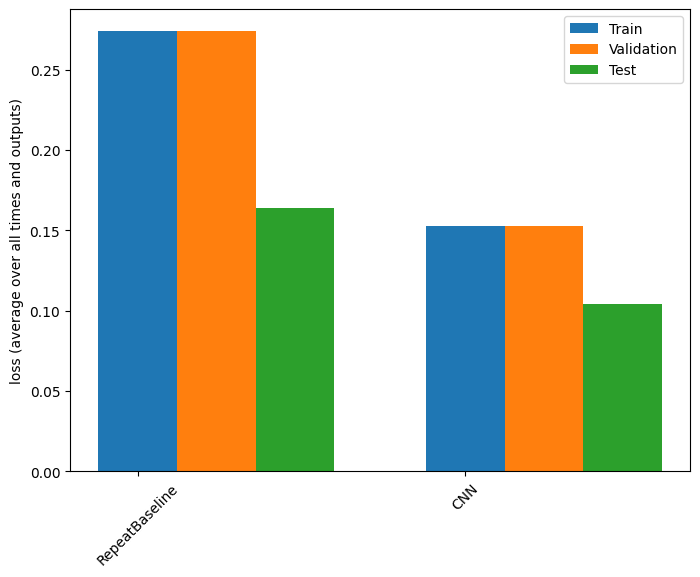

In [127]:
import numpy as np
import matplotlib.pyplot as plt

x = np.arange(len(multi_test_performance))
width = 0.24

train_loss = [v[0] for v in multi_train_performance.values()]
val_loss = [v[0] for v in multi_val_performance.values()]
test_loss = [v[0] for v in multi_test_performance.values()]

plt.bar(x  , val_loss, width, label='Train')
plt.bar(x +width , val_loss, width, label='Validation')
plt.bar(x +(2*width), test_loss, width, label='Test')
plt.xticks(ticks=x, labels=multi_test_performance.keys(), rotation=45)
plt.ylabel(f'loss (average over all times and outputs)')
_ = plt.legend()
plt.show()

In [128]:
'''for name, value in multi_performance.items():
  print(f'{name:8s}: {value[1]:0.4f}')'''

"for name, value in multi_performance.items():\n  print(f'{name:8s}: {value[1]:0.4f}')"

In [129]:
'''#plot the loss
x = np.arange(len(multi_performance))
width = 0.25

val_loss = [v[0] for v in multi_val_performance.values()]
test_loss = [v[0] for v in multi_performance.values()]

plt.bar(x - 0.15, val_loss, width, label='Validation')
plt.bar(x + 0.15, test_loss, width, label='Test')
plt.xticks(ticks=x, labels=multi_performance.keys(), rotation=45)
plt.ylabel(f'loss (average over all times and outputs)')
_ = plt.legend()
plt.show()'''

"#plot the loss\nx = np.arange(len(multi_performance))\nwidth = 0.25\n\nval_loss = [v[0] for v in multi_val_performance.values()]\ntest_loss = [v[0] for v in multi_performance.values()]\n\nplt.bar(x - 0.15, val_loss, width, label='Validation')\nplt.bar(x + 0.15, test_loss, width, label='Test')\nplt.xticks(ticks=x, labels=multi_performance.keys(), rotation=45)\nplt.ylabel(f'loss (average over all times and outputs)')\n_ = plt.legend()\nplt.show()"

In [130]:
'''#plot MAE
x = np.arange(len(multi_performance))
width = 0.25

val_mae = [v[1] for v in multi_val_performance.values()]
test_mae = [v[1] for v in multi_performance.values()]

plt.bar(x - 0.15, val_mae, width, label='Validation')
plt.bar(x + 0.15, test_mae, width, label='Test')
plt.xticks(ticks=x, labels=multi_performance.keys(), rotation=45)
plt.ylabel(f'MAE (average over all times and outputs)')
_ = plt.legend()
plt.show()'''

"#plot MAE\nx = np.arange(len(multi_performance))\nwidth = 0.25\n\nval_mae = [v[1] for v in multi_val_performance.values()]\ntest_mae = [v[1] for v in multi_performance.values()]\n\nplt.bar(x - 0.15, val_mae, width, label='Validation')\nplt.bar(x + 0.15, test_mae, width, label='Test')\nplt.xticks(ticks=x, labels=multi_performance.keys(), rotation=45)\nplt.ylabel(f'MAE (average over all times and outputs)')\n_ = plt.legend()\nplt.show()"

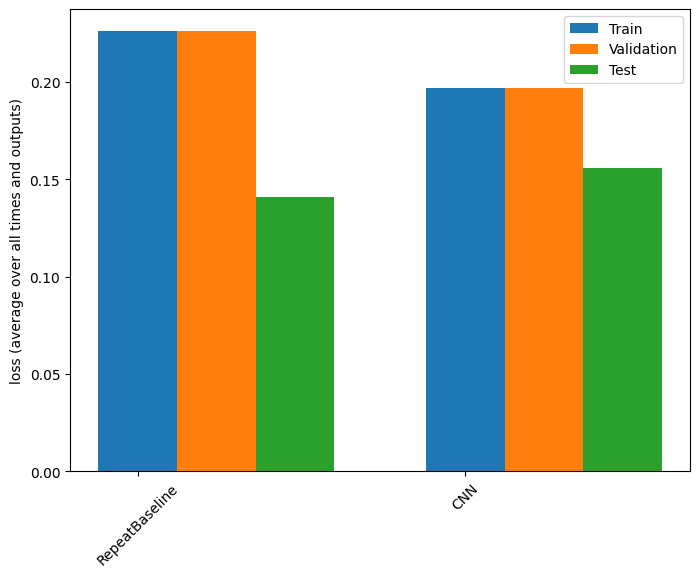

In [131]:
##mea comparsion
import numpy as np
import matplotlib.pyplot as plt

x = np.arange(len(multi_test_performance))
width = 0.24

train_loss = [v[1] for v in multi_train_performance.values()]
val_loss = [v[1] for v in multi_val_performance.values()]
test_loss = [v[1] for v in multi_test_performance.values()]

plt.bar(x  , val_loss, width, label='Train')
plt.bar(x +width , val_loss, width, label='Validation')
plt.bar(x +(2*width), test_loss, width, label='Test')
plt.xticks(ticks=x, labels=multi_test_performance.keys(), rotation=45)
plt.ylabel(f'loss (average over all times and outputs)')
_ = plt.legend()
plt.show()